In [1]:
!pip install -r /Users/amannindra/Projects/Autonomous-Bicycle/Send/requirements-autonomation.txt

In [2]:
import numpy as np
import cv2
from video_common import (
    DEFAULT_OUTPUT,
    DEFAULT_VIDEO,
    DEFAULT_WEIGHTS,
    parse_bool,
    preprocess_frame,
)
import matplotlib.pyplot as plt
import matplotlib
from pathlib import Path
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import math

In [3]:
print(np.__version__)
print(cv2.__version__)
print(matplotlib.__version__)

1.21.6
4.5.5
3.5.3


In [4]:
# MacOs

# numpy_file = np.load("/Users/amannindra/Projects/Autonomous-Bicycle/Send/numpy_output/IMG_5098_30sec_prediction.npy")
# video_file = cv2.VideoCapture("/Users/amannindra/Projects/Autonomous-Bicycle/Send/numpy_videos/IMG_5098(30sec).mp4")


#numpy_file = "/home/aman/Projects/Auto/test_videos/numpy_output/new_video_2min_prediction.npy"
numpy_file_1 = "/Users/amannindra/Projects/Autonomous-Bicycle/Send/numpy_output/IMG_5097_2min_prediction.npy"
if Path(numpy_file_1).exists():
    print("numpy_file exists")
    numpy_file = np.load(numpy_file_1)
else:    
    print("numpy_file does not exist")


#video_file_1 = "/home/aman/Projects/Auto/test_videos/movVideos/new_video2.MOV"
video_file_1 = "/Users/amannindra/Projects/Autonomous-Bicycle/Send/numpy_videos/IMG_5097(2min).mp4"
if Path(video_file_1).exists():
    print("video_File exists")
    video_file = cv2.VideoCapture(video_file_1)

else:    
    print("File does not exist")
    


numpy_file exists
video_File exists


In [5]:
# print(f"unique: {str(np.unique(numpy_file))}")

In [6]:
numpy_file.shape

(4045, 384, 640)

In [7]:
total_frames = int(video_file.get(cv2.CAP_PROP_FRAME_COUNT))
print(f"Total Frames: {total_frames}")

Total Frames: 4045


In [8]:
success, frame = video_file.read()

frame.shape


(1080, 1920, 3)

In [9]:


def run_model_and_overlay(preprocessed_frame: np.ndarray, frame_index: int):
    if not isinstance(preprocessed_frame, np.ndarray):
        raise TypeError(f"preprocessed_frame must be a NumPy array, got {type(preprocessed_frame)}")

    overlay = preprocessed_frame.copy()

    image_numpy = numpy_file[frame_index]

    overlay[image_numpy == 1] = (0, 255, 0)  # road
    overlay[image_numpy == 2] = (0, 0, 255)  # lane edge

    result = cv2.addWeighted(
        preprocessed_frame,
        0.7,
        overlay,
        0.3,
        0
    )

    return result

In [10]:
Path(video_file_1).name

'IMG_5097(2min).mp4'

In [11]:
video_width = 1080
video_hiegh = 1920
output_height = 384
output_width = 640
fps = 30
output_path = "/Users/amannindra/Projects/Autonomous-Bicycle/Send/numpy_videos_concat/numpy_" + Path(video_file_1).name
print(output_path)




def make_overlay_for_frame(video, frame):
    video.set(cv2.CAP_PROP_POS_FRAMES, frame)
    
    ret, frame_bgr = video.read()
    if not ret:
        print("Could not read frame")
    _, output_array = preprocess_frame(

                frame_bgr,
                video_width,
                video_hiegh,
                output_width,
                output_height,
    )
    result = run_model_and_overlay(output_array, frame)
    if result.shape[:2] != (384, 640):
        result = cv2.resize(result, (640, 384))
    return result

writer = cv2.VideoWriter(
    output_path,
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps,
    (output_width, output_height)
)

print("Writer opened:", writer.isOpened())


video_file.set(cv2.CAP_PROP_POS_FRAMES, 0)

i = 0
while i < 50: #total_frames/2:
    
    result = make_overlay_for_frame(video_file, i)
            
    writer.write(result)
    i += 1
    
    if i % 300 == 0:
        print(f"Processed {i} frames")
    
print("Releasing resources...")
writer.release()



/Users/amannindra/Projects/Autonomous-Bicycle/Send/numpy_videos_concat/numpy_IMG_5097(2min).mp4
Writer opened: True
Releasing resources...


In [12]:



def interval(start, num_frame):
    start_frame_index = start - 1
    fig, ax = plt.subplots(figsize=(10, 6))
    first_frame = make_overlay_for_frame(video_file, start_frame_index)

    image_display = ax.imshow(first_frame)
    ax.axis("off")

    def update(i):
        frame_index = start_frame_index + i
        result_rgb = make_overlay_for_frame(video_file, frame_index)
        image_display.set_data(result_rgb)
        ax.set_title(f"Frame {frame_index + 1}")
        return [image_display]

    ani = FuncAnimation(
        fig,
        update,
        frames=num_frame,
        interval=33,   # about 30 FPS because 1000 ms / 30 ≈ 33 ms
        blit=True
    )

    plt.close(fig)

    return HTML(ani.to_jshtml())

        
    

interval(2000, 30)

In [13]:


video_file.set(cv2.CAP_PROP_POS_FRAMES, 3)

ret, frame_bgr = video_file.read()
if not ret:
    print("Could not read frame")
input_array, output_array = preprocess_frame(
    frame_bgr,
    video_width,
    video_hiegh,
    output_width,
    output_height,
)

print(f"Shape: {input_array.shape}, {type(input_array)}")
print(f"Shape: {output_array.shape}, {type(output_array)}")


Shape: (3, 1920, 1080), <class 'numpy.ndarray'>
Shape: (384, 640, 3), <class 'numpy.ndarray'>


In [14]:
hough_img = output_array.copy()

### Hough Transform

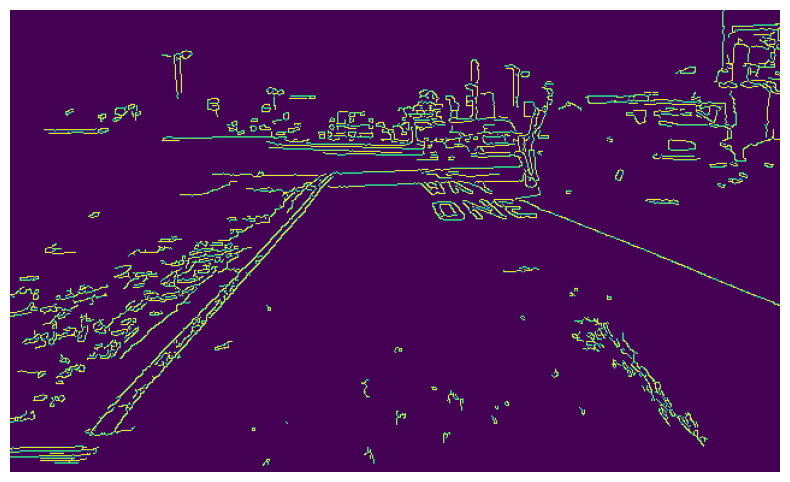

In [15]:
edges = cv2.Canny(hough_img, 50,200)

plt.figure(figsize=(10, 6))
plt.imshow(edges)
plt.axis("off")
plt.show()

In [16]:

lines = cv2.HoughLinesP(edges, 1, np.pi/180, 68, minLineLength=15, maxLineGap=250)
print(lines)
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(hough_img, (x1, y1), (x2, y2), (255, 0, 0), 3)
    

[[[ 38 376 310  94]]

 [[126  37 638 244]]

 [[ 60 373 323  81]]

 [[220 111 635  60]]

 [[227 115 609 122]]

 [[136  42 638 245]]

 [[151 154 634 128]]

 [[260 118 611 125]]

 [[ 19 324 417  45]]

 [[130 105 634 105]]

 [[ 32 102 629  81]]

 [[  0 251 638  69]]

 [[ 12 300 389  56]]

 [[ 39 376 348  67]]

 [[ 28 275 638  16]]

 [[126 108 609 117]]

 [[  5 251 631  72]]

 [[  0 367 346  66]]

 [[ 37 100 639  69]]

 [[ 21 280 635  44]]

 [[  1 254 639 107]]

 [[ 19 276 638  51]]

 [[ 56 376 301 104]]

 [[170 136 632 128]]

 [[  5 341 280  84]]

 [[180  95 629  95]]

 [[ 17 249 635 107]]

 [[222 112 609 119]]

 [[ 16 244 637  66]]

 [[ 23 301 639  52]]

 [[138  71 568  71]]

 [[ 74 101 634 101]]

 [[ 41 251 635  46]]

 [[127 106 612 114]]

 [[324  96 570 342]]

 [[  0 371 286  85]]

 [[329 108 577 356]]

 [[ 23 302 389  46]]

 [[310  93 571 354]]

 [[291  85 574 358]]

 [[ 45 102 630  92]]

 [[ 38 305 388  59]]

 [[ 19 240 636  64]]

 [[ 43 376 351  68]]

 [[ 30  99 635  68]]

 [[ 13 277

In [17]:
# plt.figure(figsize=(10, 6))
# plt.imshow(hough_img)
# plt.axis("off")
# plt.show()

In [18]:
video_file.set(cv2.CAP_PROP_POS_FRAMES, 3)
ret, frame_bgr = video_file.read()

input_array, output_array = preprocess_frame(
    frame_bgr,
    video_width,
    video_hiegh,
    output_width,
    output_height,
)

In [19]:
print("output shape\n")
print(output_array.shape)

print("output shape[0]\n")
print(output_array[0])
print(output_array[0].shape)
print(output_array[0][0].shape)

print("numpy shape\n")
print(numpy_file.shape)
print("numpy shape[0]\n")

print(numpy_file[0])
print(numpy_file[0].shape)

print("numpy shape[0][0]\n")
print(numpy_file[0][0].shape)



for i in range(len(output_array)):
    for j in range(len(output_array[0])):
        break


output shape

(384, 640, 3)
output shape[0]

[[  5   2   3]
 [  5   2   3]
 [  5   2   3]
 ...
 [124 153 160]
 [130 159 166]
 [130 159 166]]
(640, 3)
(3,)
numpy shape

(4045, 384, 640)
numpy shape[0]

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
(384, 640)
numpy shape[0][0]

(640,)


In [20]:
def find_row_boundary(mask, y, reference_x=None):
    """
    mask values:
    0 = background
    1 = road
    2 = lane/edge

    y = row index
    reference_x = expected center of ego lane on this row
                  use image center near the bottom,
                  then previous center for higher rows
    """

    row = mask[y]

    # Treat road and lane/edge as part of the usable corridor
    xs = np.where((row == 1) | (row == 2))[0]

    if len(xs) == 0:
        print("fina_row_boundry_none")
        return None

    # Split into continuous groups
    breaks = np.where(np.diff(xs) > 1)[0]
    starts = np.r_[xs[0], xs[breaks + 1]]
    ends = np.r_[xs[breaks], xs[-1]]

    segments = list(zip(starts, ends))

    # If no reference, choose the widest segment
    if reference_x is None:

        left_x, right_x = max(segments, key=lambda s: s[1] - s[0])
    else:
        # Choose the segment closest to the expected ego-lane center
        def segment_score(seg):
            left, right = seg
            center = (left + right) / 2
            return abs(center - reference_x)

        left_x, right_x = min(segments, key=segment_score)

    center_x = (left_x + right_x) / 2

    return left_x, right_x, center_x

In [47]:
height, width = numpy_file[0].shape
print(height, width)

image_center_x = width / 2

print(image_center_x)

reference_x = image_center_x


start = int(height * 0.95)
end = int(height * 0.10)

print(f"Start:", start)
print(f"end: ", end)

decrease = 6


def get_center_x(starting, ending, decreased, reference_x, frame):
    center_points = []

    i = 0
    for y in range(starting, ending, -decreased):
        i += 1
        result = find_row_boundary(frame, y, reference_x)

        if result is None:
            print("get_center_x None")
            continue

        left_x, right_x, center_x = result

        center_points.append((left_x, right_x, center_x, y))
        reference_x = center_x
    return center_points
    

    


print(i)
print(math.ceil(abs(end - start)/6))


s = get_center_x(start, end, decrease, reference_x, numpy_file[2])

print(f"center x: {s}")
x_points = []
for i in s:
    x_points.append(i[2])
    

384 640
320.0
Start: 364
end:  38
(211, 502, 356.5, 196)
55
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
center x: [(79, 639, 359.0, 364), (97, 639, 368.0, 358), (89, 639, 364.0, 352), (90, 639, 364.5, 346), (94, 639, 366.5, 340), (99, 639, 369.0, 334), (104, 639, 371.5, 328), (108, 639, 373.5, 322), (112, 639, 375.5, 316), (117, 639, 378.0, 310), (123, 639, 381.0, 304), (128, 639, 383.5, 298), (134, 639, 386.5, 292), (139, 639, 389.0, 286), (144, 639, 391.5, 280), (150, 639, 394.5, 274), (155, 639, 397.0, 268), (160, 639, 399.5, 262), (166, 639, 402.5, 256),

fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
fina_row_boundry_none
get_center_x None
left x: [88, 93, 98, 103, 108, 112, 117, 122, 127, 133, 139, 144, 150, 155, 160, 166, 171, 176, 181, 187, 191, 188, 193, 199, 204, 210, 215, 221, 226, 232, 237, 242, 248, 253, 257, 263, 267, 272, 279, 287, 299, 307, 82]
right x:[639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 639, 625, 610, 597, 582, 566, 550, 536, 520, 506, 493, 478, 464, 452, 441, 429, 416, 404, 390, 372, 359, 346, 143]
y calc: [364, 358, 352, 346, 340, 334, 328, 322, 316, 310, 304, 298, 292, 28

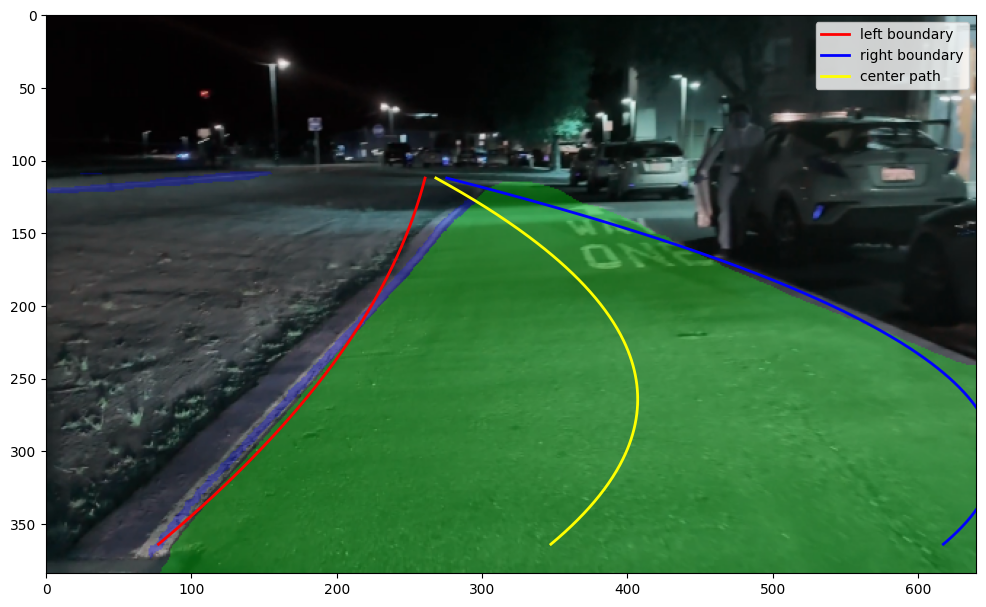

In [49]:
def show_frame(video, frame: int, left, right, x_points, y):
    result = make_overlay_for_frame(video, frame)

    plt.figure(figsize=(12, 8))
    plt.imshow(result)

    plt.scatter(left, y, color='red', marker='o', s=8, label='left')
    plt.scatter(right, y, color='blue', marker='o', s=8, label='right')
    plt.scatter(x_points, y, color='yellow', marker='o', s=8, label='center')

    plt.xlim(0, result.shape[1])
    plt.ylim(result.shape[0], 0)
    plt.legend()
    plt.show()


def show_frame_polynomial(video, frame: int, left, right, x_points, y, degree=2):
    result = make_overlay_for_frame(video, frame)

    left = np.array(left)
    right = np.array(right)
    x_points = np.array(x_points)
    y = np.array(y)

    if len(y) < degree + 1:
        raise ValueError(f"Need at least {degree + 1} points to fit a degree {degree} polynomial")

    y_curve = np.linspace(y.min(), y.max(), 300)
    left_curve = np.polyval(np.polyfit(y, left, deg=degree), y_curve)
    right_curve = np.polyval(np.polyfit(y, right, deg=degree), y_curve)
    center_curve = np.polyval(np.polyfit(y, x_points, deg=degree), y_curve)

    plt.figure(figsize=(12, 8))
    plt.imshow(result)

    plt.plot(left_curve, y_curve, color='red', linewidth=2, label='left boundary')
    plt.plot(right_curve, y_curve, color='blue', linewidth=2, label='right boundary')
    plt.plot(center_curve, y_curve, color='yellow', linewidth=2, label='center path')

    plt.xlim(0, result.shape[1])
    plt.ylim(result.shape[0], 0)
    plt.legend()
    plt.show()


frame_idx = 10
s = get_center_x(start, end, decrease, reference_x, numpy_file[frame_idx])

leftx = []
rightx = []
y_calc = []
x_points = []
for i in s:
    leftx.append(i[0])
    rightx.append(i[1])
    x_points.append(i[2])
    y_calc.append(i[3])

print(f"left x: {leftx}")
print(f"right x:{rightx}")
print(f"y calc: {y_calc}")

show_frame_polynomial(video_file, frame_idx, leftx, rightx, x_points, y_calc)


In [50]:
print(start)
print(end)

y_points = np.arange(start, end, -decrease)
print(line.shape)
print(f"center y {line}")


poly = np.polyfit(y_points, x_points, deg=2)
poly

364
38
(1, 4)
center y [[  0 236 634  43]]


TypeError: expected x and y to have same length

In [51]:
y_curve = np.linspace(y_points.min(), y_points.max(), 300)

x_curve = np.polyval(poly, y_curve)
print(x_curve)

plt.figure(figsize=(8, 5))

# Show segmentation mask as background
# plt.imshow(numpy_file[0], cmap="gray")

# Show raw center points
# plt.scatter(x_points, y_points, s=10, label="Center points")

# Show polynomial fitted line
plt.plot(x_curve, y_curve, linewidth=2, label="Polynomial fit")

# Show image center line
# plt.axvline(image_center_x, linestyle="--", label="Image center")

plt.xlim(0, width)
plt.ylim(height, 0)  # Important: image y-axis goes downward

plt.legend()
plt.title("Lane Centerline Polynomial Fit")
plt.xlabel("x pixel")
plt.ylabel("y pixel")
plt.show()

NameError: name 'poly' is not defined

In [53]:
def predict_center(numpy, video):
    total_frames = int(video_file.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total Frames: {total_frames}")
    success, frame = video.read()
    video_width = frame.shape[0]
    video_hiegh = frame.shape[1]
    output_hieght = numpy.shape[1]
    output_width = numpy.shape[2]
    print()
    fps = 30
    output_path = "/Users/amannindra/Projects/Autonomous-Bicycle/Send/numpy_videos_concat/numpy_full" + Path(video_file_1).name
    
    image_center_x = output_width/2
    image_center_y = output_height/2
    
    start = int(height * 0.95)
    end = int(height * 0.50)
    
    decrease = 6

    writer = cv2.VideoWriter(
        output_path,
        cv2.VideoWriter_fourcc(*'mp4v'),
        fps,
        (output_width, output_height)
    )
    print("Writer opened:", writer.isOpened())

    expected_y_points = np.arange(start, end, -decrease)

    i = 0
    while i < total_frames/3: #total_frames/2:
    
        result = make_overlay_for_frame(video_file, i)
        
        center_points = get_center_x(start, end, decrease, image_center_x, numpy[i])
        if len(center_points) < 3:
            # print(f"Skipping frame {i}: only {len(center_points)} center points found")
            writer.write(result)
            i += 1
            continue

        left_points = np.array([point[0] for point in center_points])
        right_points = np.array([point[1] for point in center_points])
        x_points = np.array([point[2] for point in center_points])
        y_points = np.array([point[3] for point in center_points])

        if len(center_points) != expected_y_points.shape[0]:
            missing_rows = sorted(set(expected_y_points.tolist()) - set(y_points.tolist()), reverse=True)
            print(f"Frame {i}: using {len(center_points)} of {expected_y_points.shape[0]} rows; missing {missing_rows}")

        y_curve = np.linspace(y_points.min(), y_points.max(), 300)
        left_curve = np.polyval(np.polyfit(y_points, left_points, deg=2), y_curve)
        right_curve = np.polyval(np.polyfit(y_points, right_points, deg=2), y_curve)
        center_curve = np.polyval(np.polyfit(y_points, x_points, deg=2), y_curve)

        left_pts = np.column_stack((left_curve, y_curve)).astype(np.int32).reshape((-1, 1, 2))
        right_pts = np.column_stack((right_curve, y_curve)).astype(np.int32).reshape((-1, 1, 2))
        center_pts = np.column_stack((center_curve, y_curve)).astype(np.int32).reshape((-1, 1, 2))
        
        # Draw the fitted model boundaries and center path. OpenCV colors are BGR.
        done = cv2.polylines(result, [left_pts], isClosed=False, color=(0, 0, 255), thickness=3)
        done = cv2.polylines(done, [right_pts], isClosed=False, color=(255, 0, 0), thickness=3)
        done = cv2.polylines(done, [center_pts], isClosed=False, color=(0, 255, 0), thickness=3)

        #Write the frame to the video
        # print(done)
        # print(type(done))
        writer.write(done)
        i += 1
        
        if i % 300 == 0:
            print(f"Processed {i} frames")
        
        
    print("Releasing resources...")
    writer.release()
            




predict_center(numpy_file, video_file)
    

Total Frames: 4045

Writer opened: True
fina_row_boundry_none
get_center_x None
Frame 340: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 341: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 344: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 382: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 384: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 388: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 389: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 391: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 396: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 397: using 28 of 29 rows; missing [196]
fina_row_boundry_none
get_center_x None
Frame 398: using 28 of 29 rows; missing [196]
fina_row_bound

In [54]:
4035/30

134.5